In [2]:
import glob
import os
import significantdigits as sd
# import torchio as tio
# from significantdigits import Error, Method
import numpy as np
from matplotlib import pyplot as plt
from scipy.stats import spearmanr, ttest_ind
import nibabel as nib
from nilearn import plotting
import plotly.express as px
import pandas as pd
import seaborn as sns
import warnings



## Explore Visualization of Significant Digits of Transformation Matrices

In [41]:
def read_transfo(file_name):
    """Read a 4x4 transformation matrix produced by FSL.

    Args:
        file_name: file containing the transformation matrix

    Returns:
        numpy array containing the transformation matrix
    """
    # print(file_name)
    transfo = np.zeros(shape=(4, 4))
    transfo_line = 0
    with open(file_name) as f:
        for line in f:
            line = line.strip()
            elements = line.split()
            assert (
                len(elements) == 4
            ), "Wrong format in transformation line: {0} (file name: {1})".format(
                line, file_name
            )
            for i in range(0, 4):
                transfo[transfo_line][i] = float(elements[i].strip().replace(";", ""))
            transfo_line = transfo_line + 1

    transfo_mat = np.matrix(
        [
            [transfo[0][0], transfo[0][1], transfo[0][2], transfo[0][3]],
            [transfo[1][0], transfo[1][1], transfo[1][2], transfo[1][3]],
            [transfo[2][0], transfo[2][1], transfo[2][2], transfo[2][3]],
            [0, 0, 0, 1],
        ]
    )

    return transfo_mat

def get_matrices_fuzzy(dof):

    files = {}
    for subject in glob.glob(f"results/{dof}/mca/1/*.mat"):
        subject = subject.split('/')[-1]
        files[subject] = glob.glob(f"results/{dof}/mca/*/{subject}")

    matrices = {}
    for subject in files.keys():
        matrices[subject] = []
        for i in range(1,11):
            matrices[subject].append( np.array(
                read_transfo(os.path.join('results', dof, 'mca', f'{i}', subject)) [:3,:] ))
        
        matrices[subject] = np.array(matrices[subject])
    
    return matrices


def get_matrices_arch():

    files = {}
    for subject in glob.glob(f"g5k_results/Docker/6a92985a9f458557cd62fb3eb0f0cebf/*1.mat"):
        subject = subject.split('/')[-1].split('.')[0]
        files[subject] = []

        for dir in glob.glob(f"g5k_results/Docker/*"):
            files[subject].append(f"{dir}/{subject}")

        for dir in glob.glob(f"g5k_results/GUIX/*"):
            files[subject].append(f"{dir}/{subject}")
        

    matrices = {}
    for subject in files.keys():
        matrices[subject] = []
        for file in files[subject]:
            # print(f"{file}.nii.gz.1.nii.gz")
            matrices[subject].append( np.array(
                read_transfo(f"{file}.nii.gz.1.mat")) [:3,:] )

        matrices[subject] = np.array(matrices[subject])
    
    return matrices

matrices12_fuzzy = get_matrices_fuzzy('anat-12dofs')
matrices12_arch = get_matrices_arch()


### Fuzzy

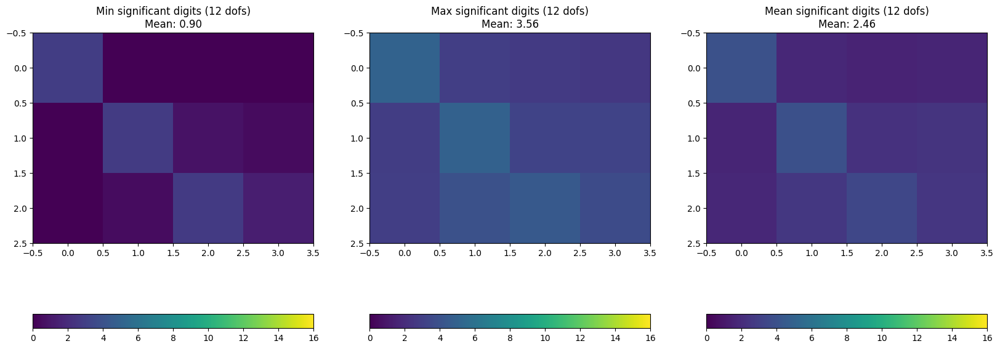

In [10]:
sigbits12 = sd.significant_digits(np.array(list(matrices12_fuzzy.values())).squeeze(), axis=1, reference=np.array(list(matrices12_fuzzy.values())).squeeze().mean(axis=1), basis=10)
minsigbits12 = np.min(sigbits12, axis=0)
maxsigbits12 = np.max(sigbits12, axis=0)
meansigbits12 = np.mean(sigbits12, axis=0)

fig, ax = plt.subplots(1,3, figsize=(20,10))

im = ax[0].imshow(minsigbits12, vmin=0, vmax=16)
ax[0].set_title(f'Min significant digits (12 dofs)\nMean: {np.mean(minsigbits12):.2f}')
plt.colorbar(im, ax=ax[0], orientation='horizontal')

im = ax[1].imshow(maxsigbits12, vmin=0, vmax=16)
ax[1].set_title(f'Max significant digits (12 dofs)\nMean: {np.mean(maxsigbits12):.2f}')
plt.colorbar(im, ax=ax[1], orientation='horizontal')

im = ax[2].imshow(meansigbits12, vmin=0, vmax=16)
ax[2].set_title(f'Mean significant digits (12 dofs)\nMean: {np.mean(meansigbits12):.2f}')
plt.colorbar(im, ax=ax[2], orientation='horizontal')

# plt.colorbar()
plt.show()


### Arch

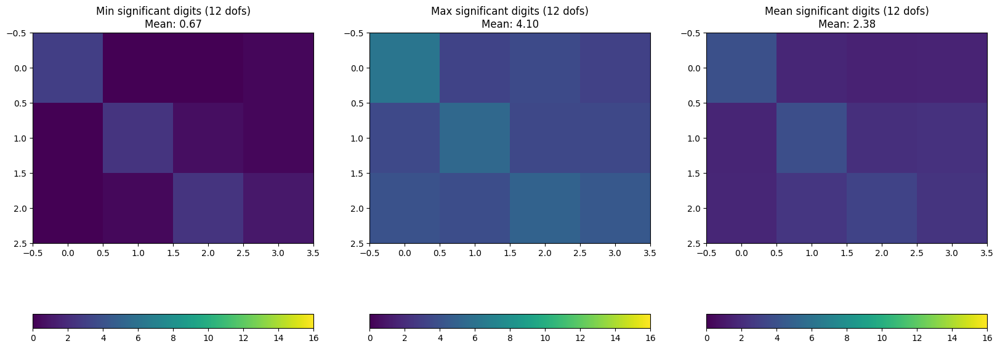

In [15]:
sigbits = sd.significant_digits(np.array(list(matrices12_arch.values())).squeeze(), axis=1, reference=np.array(list(matrices12_arch.values())).squeeze().mean(axis=1), basis=10)
minsigbits = np.min(sigbits, axis=0)
maxsigbits = np.max(sigbits, axis=0)
meansigbits = np.mean(sigbits, axis=0)

fig, ax = plt.subplots(1,3, figsize=(20,10))

im = ax[0].imshow(minsigbits, vmin=0, vmax=16)
ax[0].set_title(f'Min significant digits (12 dofs)\nMean: {np.mean(minsigbits):.2f}')
plt.colorbar(im, ax=ax[0], orientation='horizontal')

im = ax[1].imshow(maxsigbits, vmin=0, vmax=16)
ax[1].set_title(f'Max significant digits (12 dofs)\nMean: {np.mean(maxsigbits):.2f}')
plt.colorbar(im, ax=ax[1], orientation='horizontal')

im = ax[2].imshow(meansigbits, vmin=0, vmax=16)
ax[2].set_title(f'Mean significant digits (12 dofs)\nMean: {np.mean(meansigbits):.2f}')
plt.colorbar(im, ax=ax[2], orientation='horizontal')

# plt.colorbar()
plt.show()


### Check if noise outside of skull is due to resampling artifacts

Noise in transformation matrix as well as image -- unlikely to be resampling artifact

In [14]:
# selected an image with perturbation in it
matrices12_fuzzy['OAS1_0004_MR1_mpr-1_anon_reorient.mat'].shape 
artifact_check = sd.significant_digits(matrices12_fuzzy['OAS1_0004_MR1_mpr-1_anon_reorient.mat'], axis=0, reference=matrices12_fuzzy['OAS1_0004_MR1_mpr-1_anon_reorient.mat'].mean(axis=0), basis=10)
artifact_check


array([[4.04398214, 1.487785  , 1.62120444, 1.7494652 ],
       [1.92958135, 4.44178208, 3.13905321, 2.95792836],
       [1.60270218, 3.24307949, 3.40057718, 1.77747627]])

## Significant Digit Correlation Plots for Registered Images
##### Calculating the digits was done in the calc.py script outside the notebook

* Figures shown below are done using plotly and matplotlib (plotly was used for its interactiveness during the exploratory phase of trying to identify why certain images were clustered together)

#### Fuzzy vs Arch (Docker and Guix concatenated)

In [4]:
BASE = '/scratch/ine5/creatis_fsl_flirt/'

fuzzy= []
arch = []
imgs = []
subs = []
scans = []

for sub in os.listdir(f'{BASE}/results/sigmaps'):
    imgs.append(sub)
    subs.append(sub.split('_MR1')[0])
    scans.append(sub.split('mpr-')[-1].split('_')[0])

    a=np.load(f'{BASE}/results/sigmaps/{sub}') * np.log10(2)
    fuzzy.append(np.mean(a)) 

    a=np.load(f'{BASE}/g5k_results/sigmaps/{sub}') * np.log10(2)
    arch.append(np.mean(a)) 
    
df = pd.DataFrame({'fuzzy': fuzzy, 'arch': arch, 'images': imgs, 'subjects': subs, 'scans': scans})
df['scans'] = df['scans'].astype('int')
fig = px.scatter(df, x="fuzzy", y="arch", 
                 color='subjects', 
                #  size='scans', 
                 hover_data='images', 
                 title = f"Spearman Correlation: {spearmanr(df['fuzzy'], df['arch'])[0]:.5f} P-value: {spearmanr(df['fuzzy'], df['arch'])[1]:.5f}",
                 width=1000, height=600
                 )

fig.show()



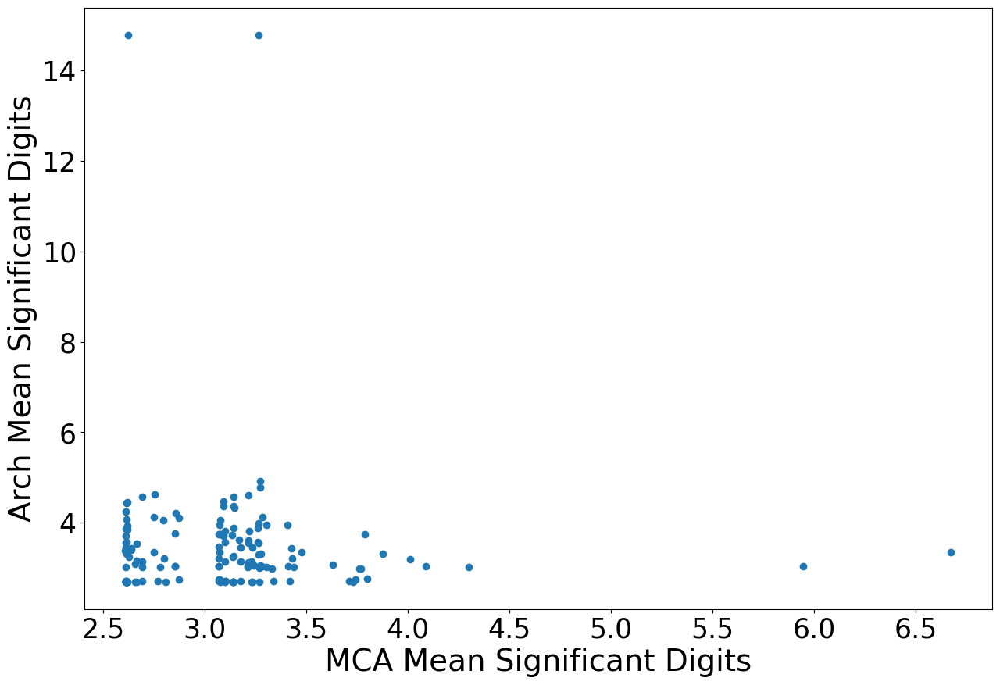

In [6]:
plt.figure(figsize=(15,10))
plt.scatter(fuzzy, arch), plt.ylabel('Arch Mean Significant Digits', size=28), plt.xlabel('MCA Mean Significant Digits', size=28)
plt.xticks(size=25), plt.yticks(size=25);
# plt.savefig('imgs/correlation_fuzzy_docker.png');

#### Fuzzy vs Docker

In [2]:
BASE = '/scratch/ine5/creatis_fsl_flirt/'

fuzzy= []
arch = []
imgs = []
subs = []
scans = []

for sub in os.listdir(f'{BASE}/results/sigmaps'):

    imgs.append(sub)
    subs.append(sub.split('_MR1')[0])
    scans.append(sub.split('mpr-')[-1].split('_')[0])

    a=np.load(f'{BASE}/results/sigmaps/{sub}') * np.log10(2)
    fuzzy.append(np.mean(a)) 

    a=np.load(f'{BASE}/g5k_results/sigmaps/Docker/{sub}') * np.log10(2)
    arch.append(np.mean(a)) 

df = pd.DataFrame({'fuzzy': fuzzy, 'docker': arch, 'images': imgs, 'subjects': subs, 'scans': scans})
df['scans'] = df['scans'].astype('int')
fig = px.scatter(df, x="fuzzy", y="docker", 
                 color='subjects', 
                #  size='scans', 
                 hover_data='images', 
                 title = f"Fuzzy vs Docker\nSpearman Correlation: {spearmanr(df['fuzzy'], df['docker'])[0]:.5f} P-value: {spearmanr(df['fuzzy'], df['docker'])[1]:.5f}",
                width=1000, height=600
                 )
# fig.update_layout(xaxis_range=[0,3], yaxis_range=[0,6])
fig.show()
# fig.write_html("sigdigit_scatter.html")



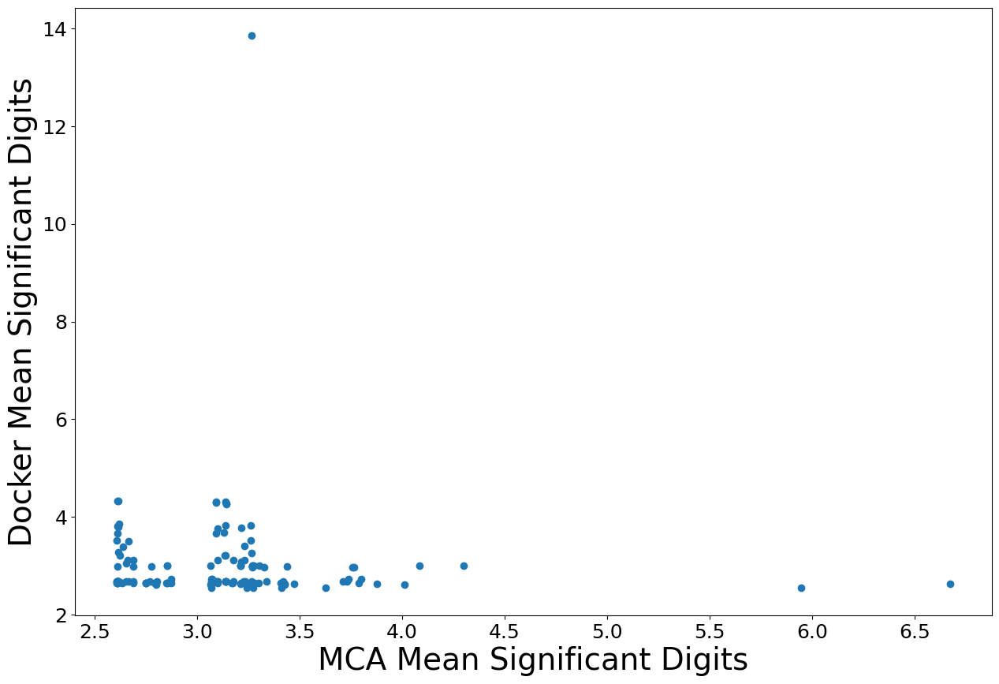

In [3]:
plt.figure(figsize=(15,10))
plt.scatter(fuzzy, arch), plt.ylabel('Docker Mean Significant Digits', size=28), plt.xlabel('MCA Mean Significant Digits', size=28)
plt.xticks(size=25), plt.yticks(size=25)
plt.savefig('imgs/correlation_fuzzy_docker.png');

#### Fuzzy vs GUIX

In [4]:
BASE = '/scratch/ine5/creatis_fsl_flirt/'

fuzzy= []
arch = []
imgs = []
subs = []
scans = []

for sub in os.listdir('results/sigmaps'):

    imgs.append(sub)
    subs.append(sub.split('_MR1')[0])
    scans.append(sub.split('mpr-')[-1].split('_')[0])

    a=np.load(f'results/sigmaps/{sub}') * np.log10(2)
    fuzzy.append(np.mean(a)) 

    a=np.load(f'g5k_results/sigmaps/GUIX/{sub}') * np.log10(2)
    arch.append(np.mean(a)) 

df = pd.DataFrame({'fuzzy': fuzzy, 'GUIX': arch, 'images': imgs, 'subjects': subs, 'scans': scans})
df['scans'] = df['scans'].astype('int')
fig = px.scatter(df, x="fuzzy", y="GUIX", 
                 color='subjects', 
                #  size='scans', 
                 hover_data='images', 
                 title = f"Fuzzy vs GUIX\nSpearman Correlation: {spearmanr(df['fuzzy'], df['GUIX'])[0]:.5f} P-value: {spearmanr(df['fuzzy'], df['GUIX'])[1]:.5f}",
                width=1000, height=600
                 )
fig.show()



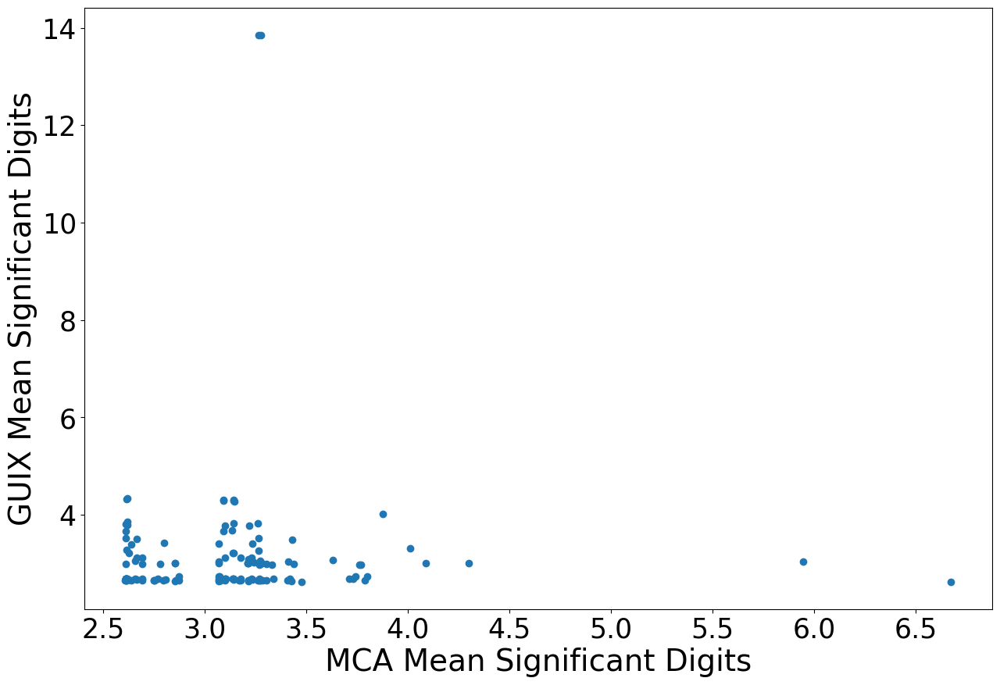

In [5]:
plt.figure(figsize=(15,10))
plt.scatter(fuzzy, arch), plt.ylabel('GUIX Mean Significant Digits', size=28), plt.xlabel('MCA Mean Significant Digits', size=28)
plt.xticks(size=25), plt.yticks(size=25)
plt.savefig('imgs/correlation_fuzzy_guix.png');

#### Docker vs GUIX

In [6]:
BASE = '/scratch/ine5/creatis_fsl_flirt/'

fuzzy= []
arch = []
imgs = []
subs = []
scans = []

for sub in os.listdir(f'{BASE}/results/sigmaps'):

    imgs.append(sub)
    subs.append(sub.split('_MR1')[0])
    scans.append(sub.split('mpr-')[-1].split('_')[0])

    a=np.load(f'{BASE}/g5k_results/sigmaps/Docker/{sub}') * np.log10(2)
    fuzzy.append(np.mean(a)) 

    a=np.load(f'{BASE}/g5k_results/sigmaps/GUIX/{sub}') * np.log10(2)
    arch.append(np.mean(a)) 

df = pd.DataFrame({'Docker': fuzzy, 'GUIX': arch, 'images': imgs, 'subjects': subs, 'scans': scans})
df['scans'] = df['scans'].astype('int')
fig = px.scatter(df, x="Docker", y="GUIX", 
                 color='subjects', 
                #  size='scans', 
                 hover_data='images', 
                 title = f"Docker vs GUIX\nSpearman Correlation: {spearmanr(df['Docker'], df['GUIX'])[0]:.5f} P-value: {spearmanr(df['Docker'], df['GUIX'])[1]:.4E}",
                width=1000, height=600
                 )
fig.show()



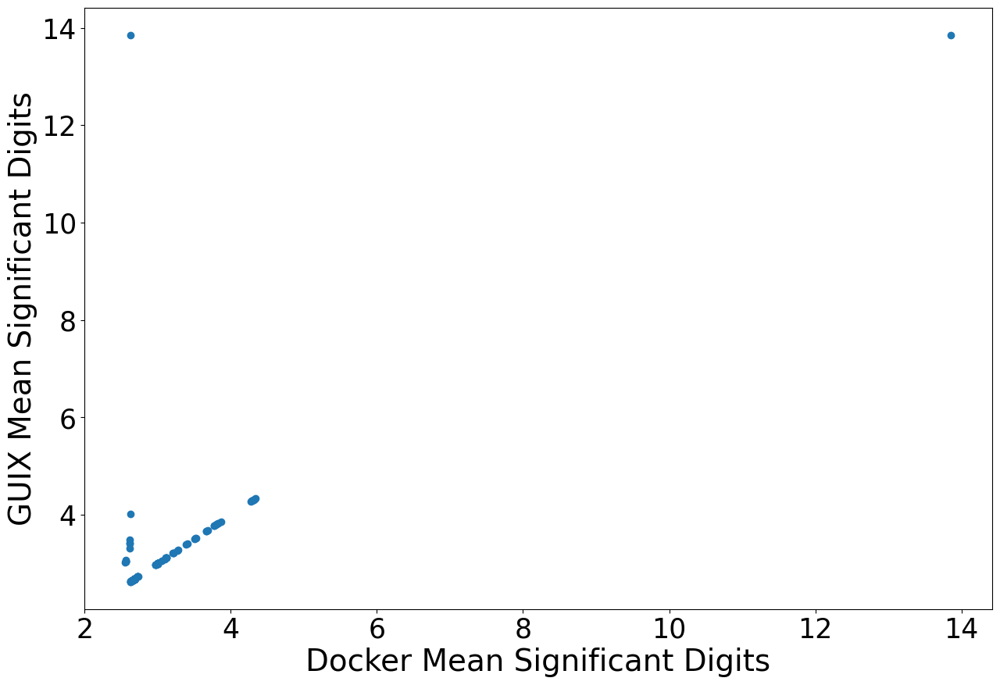

In [7]:
plt.figure(figsize=(15,10))
plt.scatter(fuzzy, arch), plt.ylabel('GUIX Mean Significant Digits', size=28), plt.xlabel('Docker Mean Significant Digits', size=28)
plt.xticks(size=25), plt.yticks(size=25)
plt.savefig('imgs/correlation_docker_guix.png');

# Visualizing Sigmaps

### Examining Sigmaps of Subjects From Each Distribution Seen within Fuzzy MCA vs Arch (Docker and GUIX concatenated)
* We visually examined randomly sampled images from each distribution for any trends or differences -- nothing was found

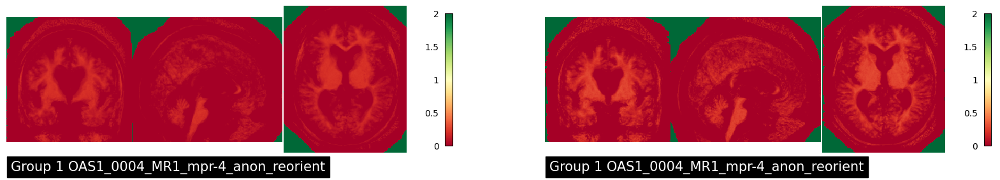

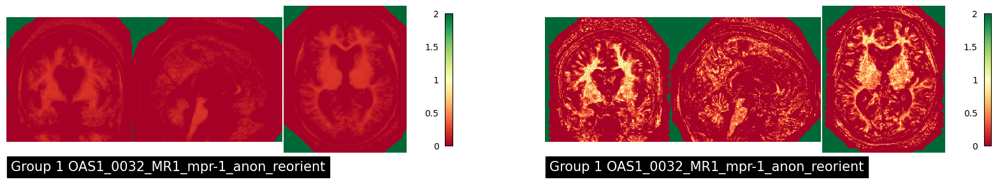

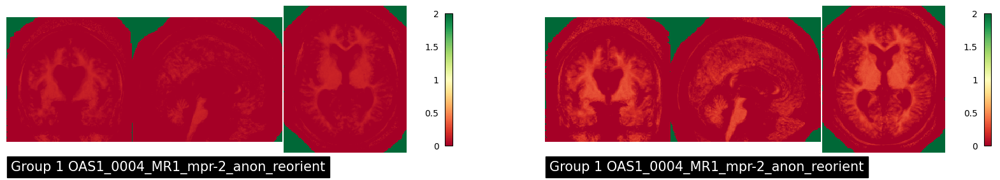

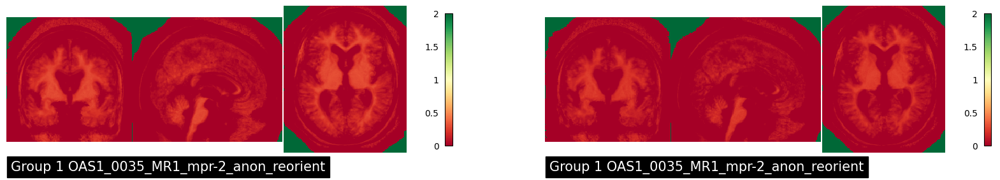

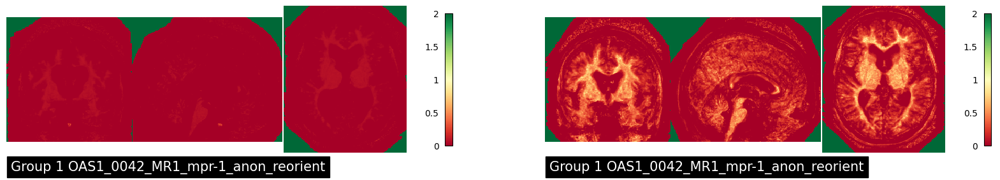

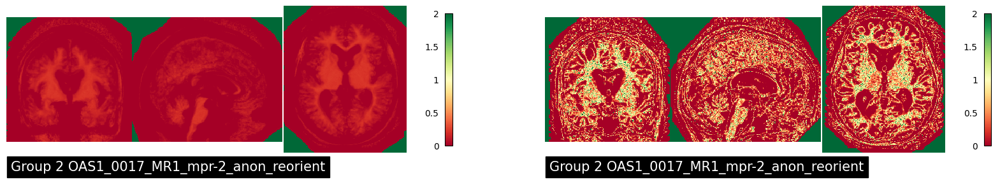

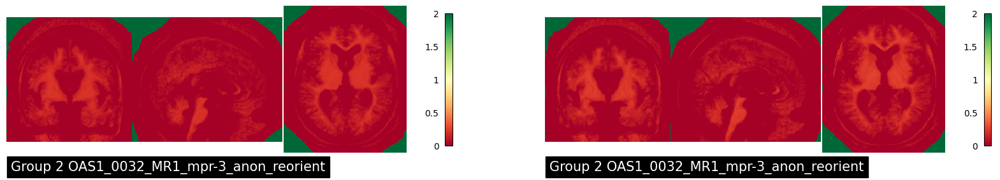

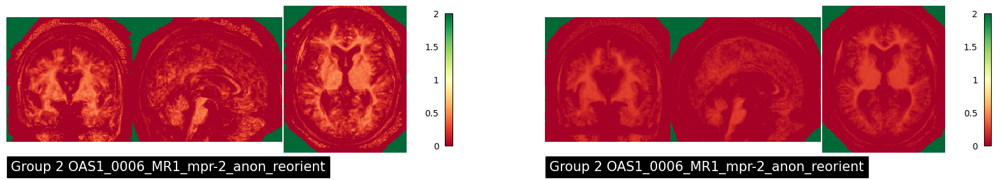

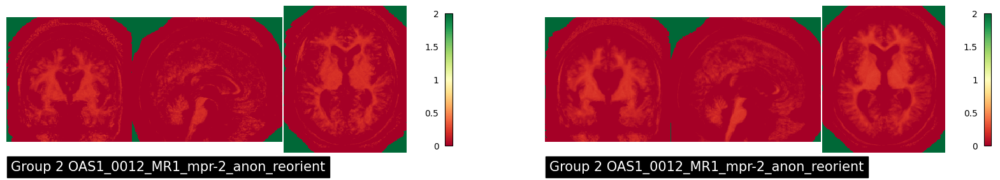

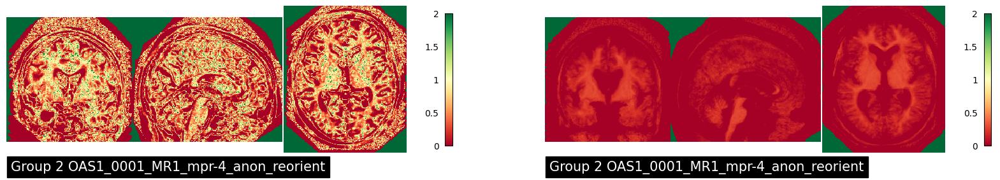

In [4]:
BASE = '/scratch/ine5/creatis_fsl_flirt/'

##Group 1 fuzzy > 3
for sub in ['OAS1_0004_MR1_mpr-4_anon_reorient', 'OAS1_0032_MR1_mpr-1_anon_reorient', 'OAS1_0004_MR1_mpr-2_anon_reorient', 'OAS1_0035_MR1_mpr-2_anon_reorient', 'OAS1_0042_MR1_mpr-1_anon_reorient']:

    a=np.load(f'{BASE}/results/sigmaps/{sub}.npy') * np.log10(2)
    img = nib.load(f"{BASE}/results/anat-12dofs/ieee/{sub.split('.')[0]}.nii.gz")
    fuzzy = nib.nifti1.Nifti1Image(a, img.affine) 

    a=np.load(f'{BASE}/g5k_results/sigmaps/{sub}.npy') * np.log10(2)
    img = nib.load(f"{BASE}/results/anat-12dofs/ieee/{sub.split('.')[0]}.nii.gz")
    arch = nib.nifti1.Nifti1Image(a, img.affine) 


    fig, axes = plt.subplots(1,2, figsize=(20,3))

    display = plotting.plot_img(fuzzy, cut_coords=(0,0,0), annotate=False, draw_cross=False, threshold=0, bg_img=None,cmap='RdYlGn',colorbar=True, vmin=0, vmax=2, axes=axes[0])
    display.title(f"Group 1 {sub.split('.')[0]}", size=15, y=-0.05)

    display = plotting.plot_img(arch, cut_coords=(0,0,0), annotate=False, draw_cross=False, threshold=0, bg_img=None,cmap='RdYlGn',colorbar=True, vmin=0, vmax=2, axes=axes[1])
    display.title(f"Group 1 {sub.split('.')[0]}", size=15, y=-0.05)


##Group 2 fuzzy < 3
for sub in ['OAS1_0017_MR1_mpr-2_anon_reorient', 'OAS1_0032_MR1_mpr-3_anon_reorient', 'OAS1_0006_MR1_mpr-2_anon_reorient', 'OAS1_0012_MR1_mpr-2_anon_reorient', 'OAS1_0001_MR1_mpr-4_anon_reorient']:

    a=np.load(f'{BASE}/results/sigmaps/{sub}.npy') * np.log10(2)
    img = nib.load(f"{BASE}/results/anat-12dofs/ieee/{sub.split('.')[0]}.nii.gz")
    fuzzy = nib.nifti1.Nifti1Image(a, img.affine) 

    a=np.load(f'{BASE}/g5k_results/sigmaps/{sub}.npy') * np.log10(2)
    img = nib.load(f"{BASE}/results/anat-12dofs/ieee/{sub.split('.')[0]}.nii.gz")
    arch = nib.nifti1.Nifti1Image(a, img.affine) 


    fig, axes = plt.subplots(1,2, figsize=(20,3))

    display = plotting.plot_img(fuzzy, cut_coords=(0,0,0), annotate=False, draw_cross=False, threshold=0, bg_img=None,cmap='RdYlGn',colorbar=True, vmin=0, vmax=2, axes=axes[0])
    display.title(f"Group 2 {sub.split('.')[0]}", size=15, y=-0.05)

    display = plotting.plot_img(arch, cut_coords=(0,0,0), annotate=False, draw_cross=False, threshold=0, bg_img=None,cmap='RdYlGn',colorbar=True, vmin=0, vmax=2, axes=axes[1])
    display.title(f"Group 2 {sub.split('.')[0]}", size=15, y=-0.05)


### "Stable" Outlier Subjects from Fuzzy vs Arch (Docker + GUIX) Correlation Plot

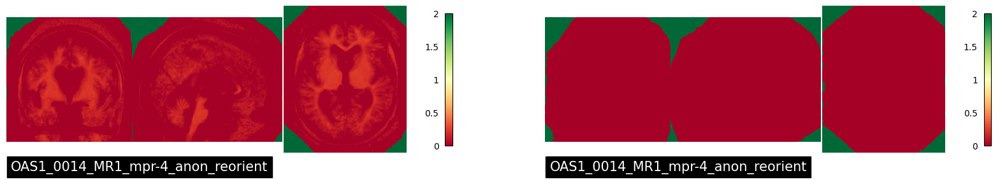

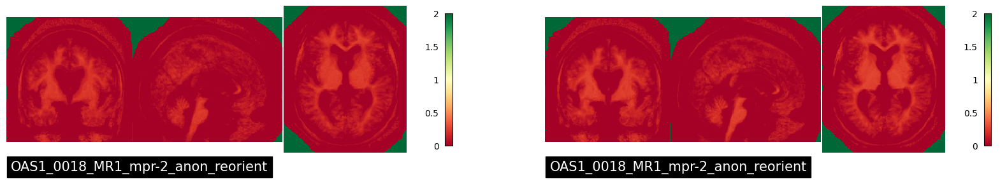

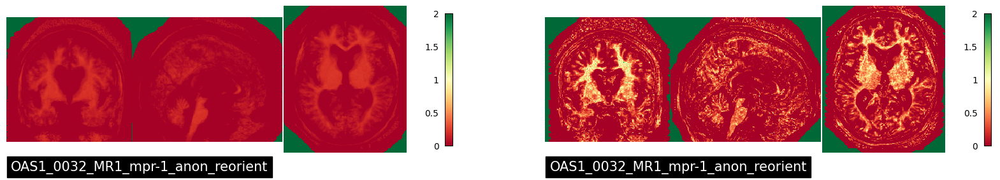

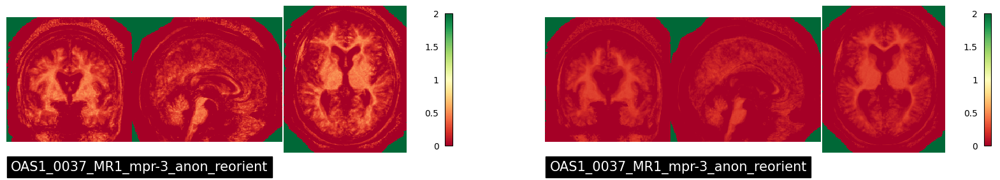

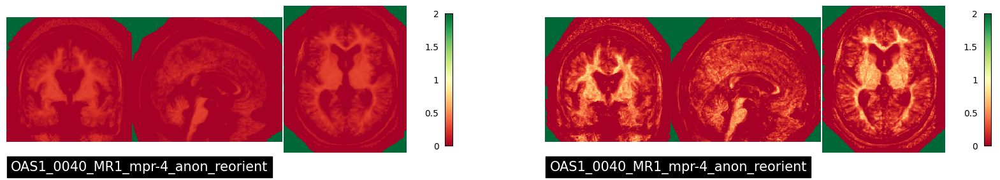

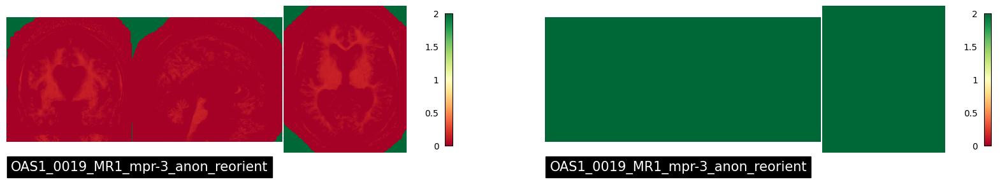

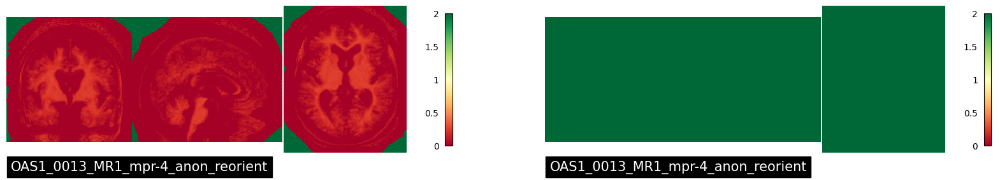

In [8]:
BASE = '/scratch/ine5/creatis_fsl_flirt/'

for sub in ['OAS1_0014_MR1_mpr-4_anon_reorient', 'OAS1_0018_MR1_mpr-2_anon_reorient', 'OAS1_0032_MR1_mpr-1_anon_reorient', 'OAS1_0037_MR1_mpr-3_anon_reorient', 'OAS1_0040_MR1_mpr-4_anon_reorient', 'OAS1_0019_MR1_mpr-3_anon_reorient', 'OAS1_0013_MR1_mpr-4_anon_reorient']:

    a=np.load(f'{BASE}/results/sigmaps/{sub}.npy') * np.log10(2)
    img = nib.load(f"{BASE}/results/anat-12dofs/ieee/{sub.split('.')[0]}.nii.gz")
    fuzzy = nib.nifti1.Nifti1Image(a, img.affine) 

    a=np.load(f'{BASE}/g5k_results/sigmaps/{sub}.npy') * np.log10(2)
    img = nib.load(f"{BASE}/results/anat-12dofs/ieee/{sub.split('.')[0]}.nii.gz")
    arch = nib.nifti1.Nifti1Image(a, img.affine) 


    fig, axes = plt.subplots(1,2, figsize=(20,3))

    display = plotting.plot_img(fuzzy, cut_coords=(0,0,0), annotate=False, draw_cross=False, threshold=0, bg_img=None,cmap='RdYlGn',colorbar=True, vmin=0, vmax=2, axes=axes[0])
    display.title(f"{sub.split('.')[0]}", size=15, y=-0.05)

    display = plotting.plot_img(arch, cut_coords=(0,0,0), annotate=False, draw_cross=False, threshold=0, bg_img=None,cmap='RdYlGn',colorbar=True, vmin=0, vmax=2, axes=axes[1])
    display.title(f"{sub.split('.')[0]}", size=15, y=-0.05)


### Consult Sigmap_visualization.ipynb for All Subject Sigmaps

# Boxplots Comparing Magnitude

In [8]:
PROPS = {
        'boxprops':{'facecolor':'none', 'edgecolor':'black'},
        'medianprops':{'color':'black'},
        'whiskerprops':{'color':'black'},
        'capprops':{'color':'black'}
    }

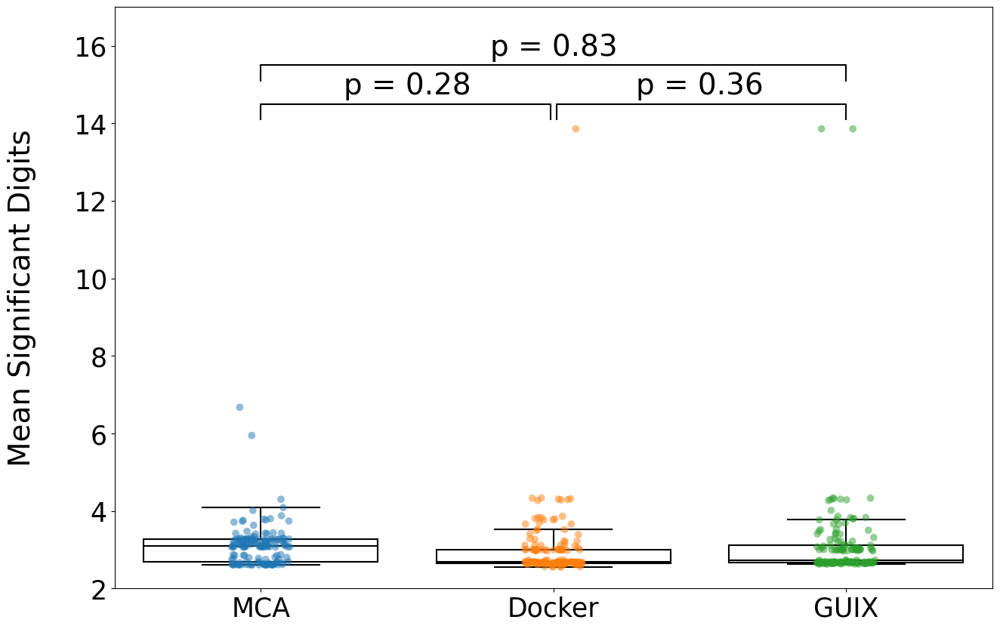

In [11]:
warnings.filterwarnings("ignore")

BASE = '/scratch/ine5/creatis_fsl_flirt/'

fuzzy= []
docker = []
guix = []
imgs = []


for sub in os.listdir(f'{BASE}/results/sigmaps'):
    imgs.append(sub)
    subs.append(sub.split('_MR1')[0])
    scans.append(sub.split('mpr-')[-1].split('_')[0])

    a=np.load(f'{BASE}/results/sigmaps/{sub}') * np.log10(2)
    # img = nib.load(f"results/anat-12dofs/ieee/{sub.split('.')[0]}.nii.gz")
    fuzzy.append(np.mean(a)) 

    a=np.load(f'{BASE}/g5k_results/sigmaps/Docker/{sub}') * np.log10(2)
    # img = nib.load(f"results/anat-12dofs/ieee/{sub.split('.')[0]}.nii.gz")
    docker.append(np.mean(a)) 

    a=np.load(f'{BASE}/g5k_results/sigmaps/GUIX/{sub}') * np.log10(2)
    # img = nib.load(f"results/anat-12dofs/ieee/{sub.split('.')[0]}.nii.gz")
    guix.append(np.mean(a)) 


t_statistic_fuzdocker, p_value_fuzdocker = ttest_ind(fuzzy, docker)
t_statistic_fuzguix, p_value_fuzguix = ttest_ind(fuzzy, guix)
t_statistic_dockerguix, p_value_dockerguix = ttest_ind(docker, guix)

plt.figure(figsize=(15,10))


sns.boxplot(data=[fuzzy, docker, guix], showfliers = False, **PROPS)
g = sns.stripplot(data=[fuzzy, docker, guix], alpha=0.5, size=7)
g.set_xticklabels(['MCA', 'Docker', 'GUIX'], fontsize=28)
# g.set_title(f'Comparison of Variability in Fuzzy, Docker and GUIX', size=20)
g.set_ylabel('Mean Significant Digits\n', fontsize=28);
# fuzzy vs docker
g.text((1)*.5, 14.6, f"p = {p_value_fuzdocker:.2f}", ha='center', va='bottom', size=28) #1.00 * 10^-6
plt.plot([0, 0, 0.99, 0.99], [14.1, 14.5, 14.5, 14.1], lw=1.5, c='black')
# docker vs guix
g.text((3)*.5, 14.6, f"p = {p_value_dockerguix:.2f}", ha='center', va='bottom', size=28) #1.00 * 10^-6
plt.plot([1.01, 1.01, 2, 2], [14.1, 14.5, 14.5, 14.1], lw=1.5, c='black')
# fuzzy vs guix
g.text((1), 15.6, f"p = {p_value_fuzguix:.2f}", ha='center', va='bottom', size=28) #1.00 * 10^-6
plt.plot([0, 0, 2, 2], [15.1, 15.5, 15.5, 15.1], lw=1.5, c='black')
plt.xticks(size=25), plt.yticks(size=25)
plt.ylim((2,17))
plt.savefig('imgs/sigdig_magnitude.png');



# Matrices Plots

In [64]:
PROPS = {
        'boxprops':{'facecolor':'none', 'edgecolor':'black'},
        'medianprops':{'color':'black'},
        'whiskerprops':{'color':'black'},
        'capprops':{'color':'black'}
    }

In [146]:
from transfo_utils import *

rigid_trans = {}
rot_mat = {}
for mat in glob.glob(f'results/anat-12dofs/mca/2/*.mat'):
    
    sub = mat.split('/')[-1].split('.')[0]
    rigid_trans[sub] = []
    rot_mat[sub] = []

    for i in range(1, 11):

        #translation 
        rigid_trans[sub].append( read_rigid_transfo(f'results/anat-12dofs/mca/{i}/{sub}.mat')[:3, 3:] )
        
        #rotation
        transfo_mat = read_transfo(f'results/anat-12dofs/mca/{i}/{sub}.mat')
        rotation_matrix = get_rot_mat( transfo_mat )
        rot_mat[sub].append( get_rot_angle_vec(rotation_matrix)[-1] )


dist_trans_fuzzy = {}

for sub, pairs in rigid_trans.items():

    dist_trans_fuzzy[sub] = []

    for i in range(len(pairs)):
        for j in range(i+1, len(pairs)):
    
            dist_trans_fuzzy[sub].append(np.linalg.norm( pairs[i] - pairs[j] ))

    dist_trans_fuzzy[sub] = np.mean(dist_trans_fuzzy[sub])

dist_rot_fuzzy = {}

for sub, pairs in rot_mat.items():
    dist_rot_fuzzy[sub] = []

    for i in range(len(pairs)):
        for j in range(i+1, len(pairs)):
            
            dist_rot_fuzzy[sub].append( np.linalg.norm( pairs[i] - pairs[j] ))

    dist_rot_fuzzy[sub] = np.mean(dist_rot_fuzzy[sub])



In [76]:
rigid_trans = {}
rot_mat = {}

for dir in ['Docker', 'GUIX']:

    rigid_trans[dir] = {}
    rot_mat[dir] = {}

    for sub in glob.glob(f'g5k_results/Docker/03f8688da59b02bc55922c9dca322fe2/*.mat'):  

        sub = sub.split('/')[-1].split('.')[0]
        rigid_trans[dir][sub] = []
        rot_mat[dir][sub] = []
        # print(sub)

        for checksum in glob.glob(f'g5k_results/{dir}/*'):

            #translation 
            rigid_trans[dir][sub].append( read_rigid_transfo(f'{checksum}/{sub}.nii.gz.1.mat')[:3, 3:] )
            
            #rotation
            transfo_mat = read_transfo(f'{checksum}/{sub}.nii.gz.1.mat')
            rotation_matrix = get_rot_mat( transfo_mat )
            rot_mat[dir][sub].append( get_rot_angle_vec(rotation_matrix)[-1] )



dist_trans_arch = {}

for dir, arch in rigid_trans.items():
    dist_trans_arch[dir] = {}


    for sub, pairs in arch.items():
                
        dist_trans_arch[dir][sub] = np.mean(np.linalg.norm( pairs[0] - pairs[1] ))

dist_rot_arch = {}

for dir, arch in rot_mat.items():
    dist_rot_arch[dir] = {}
    for sub, pairs in arch.items():
        dist_rot_arch[dir][sub] = np.mean(np.linalg.norm( pairs[0] - pairs[1] ))

## Translation

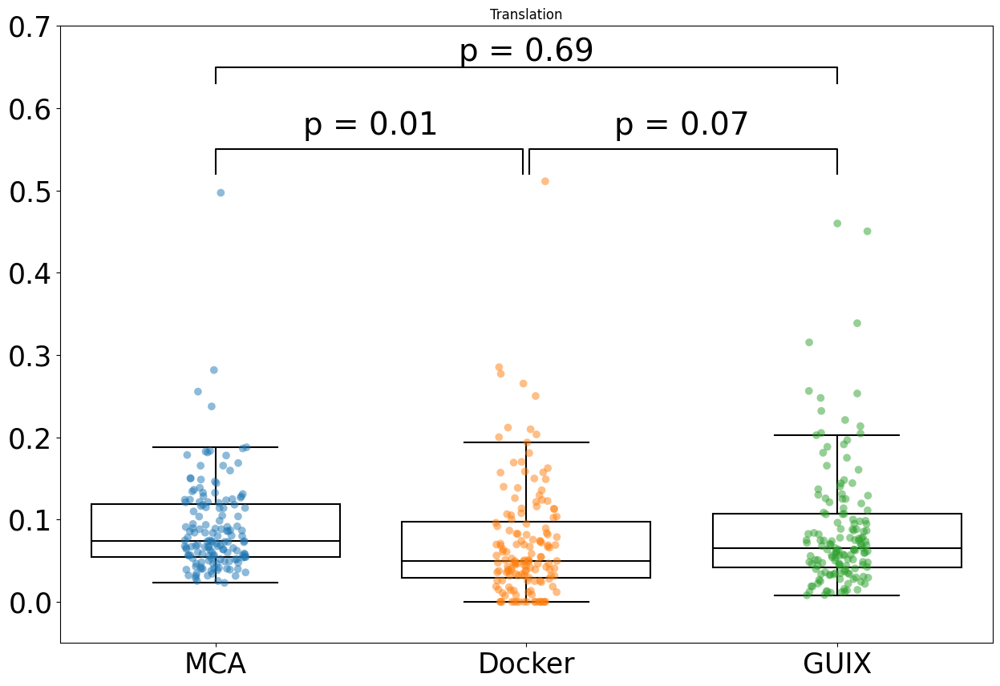

In [168]:
warnings.filterwarnings("ignore")


t_statistic_fuzdocker, p_value_fuzdocker = ttest_ind( list(dist_trans_fuzzy.values()), list(dist_trans_arch['Docker'].values()) )
t_statistic_fuzguix, p_value_fuzguix = ttest_ind( list(dist_trans_fuzzy.values()), list(dist_trans_arch['GUIX'].values()) )
t_statistic_dockerguix, p_value_dockerguix = ttest_ind( list(dist_trans_arch['Docker'].values()), list(dist_trans_arch['GUIX'].values()) )

plt.figure(figsize=(15,10))


sns.boxplot(data=[list(dist_trans_fuzzy.values()), list(dist_trans_arch['Docker'].values()), list(dist_trans_arch['GUIX'].values()) ], showfliers = False, **PROPS)
g = sns.stripplot(data=[list(dist_trans_fuzzy.values()), list(dist_trans_arch['Docker'].values()), list(dist_trans_arch['GUIX'].values()) ], alpha=0.5, size=7)
g.set_xticklabels(['MCA', 'Docker', 'GUIX'], fontsize=28)
# g.set_title(f'Comparison of Variability in Fuzzy, Docker and GUIX', size=20)
# g.set_ylabel('Mean Significant Digits\n', fontsize=28);
# fuzzy vs docker
g.text((1)*.5, 0.56, f"p = {p_value_fuzdocker:.2f}", ha='center', va='bottom', size=28) #1.00 * 10^-6
plt.plot([0, 0, 0.99, 0.99], [0.52, 0.55, 0.55, 0.52], lw=1.5, c='black')
# docker vs guix
g.text((3)*.5, 0.56, f"p = {p_value_dockerguix:.2f}", ha='center', va='bottom', size=28) #1.00 * 10^-6
plt.plot([1.01, 1.01, 2, 2], [0.52, 0.55, 0.55, 0.52], lw=1.5, c='black')
# fuzzy vs guix
g.text((1), 0.65, f"p = {p_value_fuzguix:.2f}", ha='center', va='bottom', size=28) #1.00 * 10^-6
plt.plot([0, 0, 2, 2], [0.63, 0.65, 0.65, 0.63], lw=1.5, c='black')
plt.xticks(size=25), plt.yticks(size=25);
plt.ylim((-0.05,0.7))
plt.title('Translation');
# plt.savefig('imgs/sigdig_magnitude.png');



## Rotation

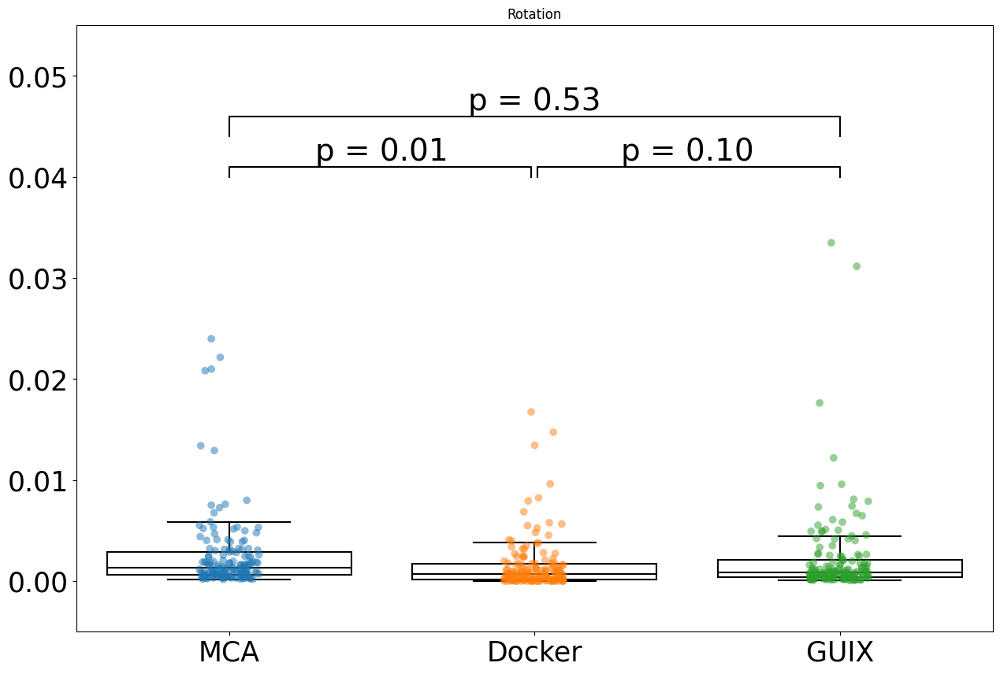

In [180]:
warnings.filterwarnings("ignore")


t_statistic_fuzdocker, p_value_fuzdocker = ttest_ind( list(dist_rot_fuzzy.values()), list(dist_trans_arch['Docker'].values()) )
t_statistic_fuzguix, p_value_fuzguix = ttest_ind( list(dist_rot_fuzzy.values()), list(dist_trans_arch['GUIX'].values()) )
t_statistic_dockerguix, p_value_dockerguix = ttest_ind( list(dist_trans_arch['Docker'].values()), list(dist_trans_arch['GUIX'].values()) )

plt.figure(figsize=(15,10))


sns.boxplot(data=[list(dist_rot_fuzzy.values()), list(dist_trans_arch['Docker'].values()), list(dist_trans_arch['GUIX'].values()) ], showfliers = False, **PROPS)
g = sns.stripplot(data=[list(dist_rot_fuzzy.values()), list(dist_trans_arch['Docker'].values()), list(dist_trans_arch['GUIX'].values()) ], alpha=0.5, size=7)
g.set_xticklabels(['MCA', 'Docker', 'GUIX'], fontsize=28)
# g.set_title(f'Comparison of Variability in Fuzzy, Docker and GUIX', size=20)
# g.set_ylabel('Mean Significant Digits\n', fontsize=28);
# fuzzy vs docker
g.text((1)*.5, 0.041, f"p = {p_value_fuzdocker:.2f}", ha='center', va='bottom', size=28) #1.00 * 10^-6
plt.plot([0, 0, 0.99, 0.99], [0.04, 0.041, 0.041, 0.04], lw=1.5, c='black')
# docker vs guix
g.text((3)*.5, 0.041, f"p = {p_value_dockerguix:.2f}", ha='center', va='bottom', size=28) #1.00 * 10^-6
plt.plot([1.01, 1.01, 2, 2], [0.04, 0.041, 0.041, 0.04], lw=1.5, c='black')
# fuzzy vs guix
g.text((1), 0.046, f"p = {p_value_fuzguix:.2f}", ha='center', va='bottom', size=28) #1.00 * 10^-6
plt.plot([0, 0, 2, 2], [0.044, 0.046, 0.046, 0.044], lw=1.5, c='black')
plt.xticks(size=25), plt.yticks(size=25);
plt.ylim((-0.005,0.055))
plt.title('Rotation');
# plt.savefig('imgs/sigdig_magnitude.png');



## Correlation Plots

### Translation

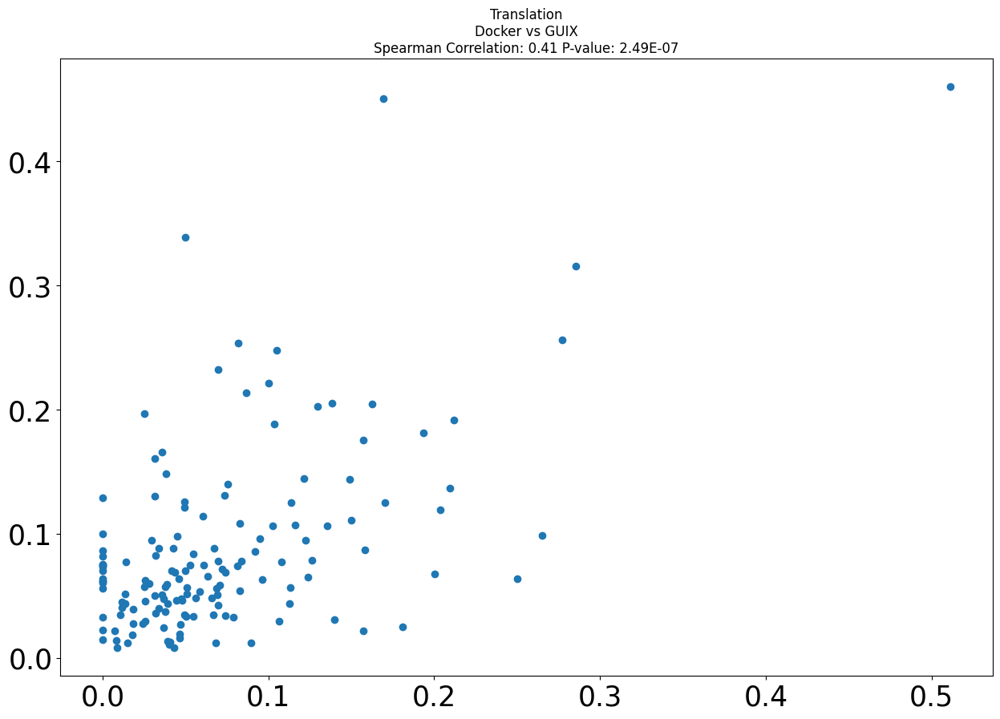

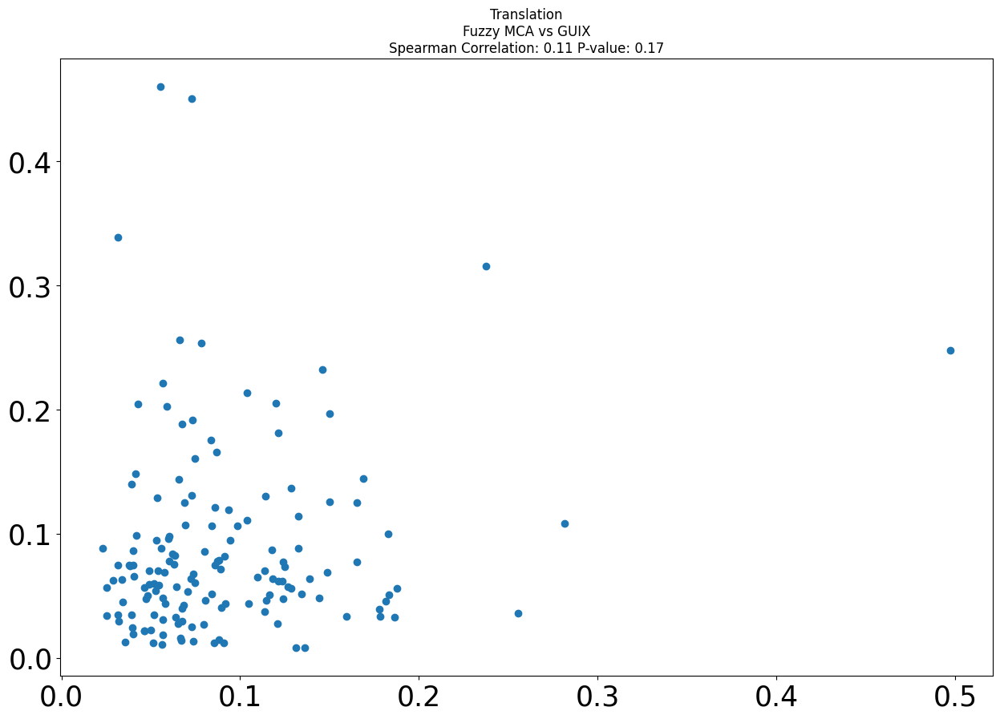

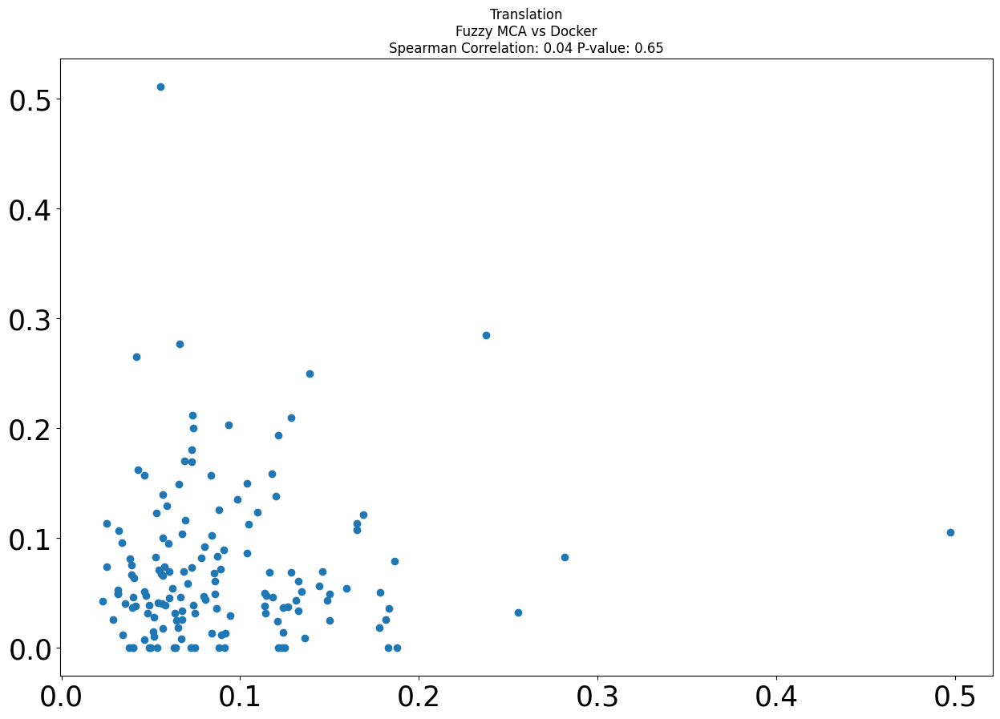

In [178]:
plt.figure(figsize=(15,10))
plt.scatter(list(dist_trans_arch['Docker'].values()), list(dist_trans_arch['GUIX'].values())), #plt.ylabel('Docker Mean Significant Digits', size=28), plt.xlabel('GUIX Mean Significant Digits', size=28)
plt.xticks(size=25), plt.yticks(size=25)
plt.title(f"Translation\nDocker vs GUIX\nSpearman Correlation: {spearmanr(list(dist_trans_arch['Docker'].values()), list(dist_trans_arch['GUIX'].values()))[0]:.2f} P-value: {spearmanr(list(dist_trans_arch['Docker'].values()), list(dist_trans_arch['GUIX'].values()))[1]:.2E}");
# plt.savefig('imgs/correlation_fuzzy_docker.png');

plt.figure(figsize=(15,10))
plt.scatter(list(dist_trans_fuzzy.values()), list(dist_trans_arch['GUIX'].values())), #plt.ylabel('Docker Mean Significant Digits', size=28), plt.xlabel('GUIX Mean Significant Digits', size=28)
plt.xticks(size=25), plt.yticks(size=25)
plt.title(f"Translation\nFuzzy MCA vs GUIX\nSpearman Correlation: {spearmanr(list(dist_trans_fuzzy.values()), list(dist_trans_arch['GUIX'].values()))[0]:.2f} P-value: {spearmanr(list(dist_trans_fuzzy.values()), list(dist_trans_arch['GUIX'].values()))[1]:.2f}");
# plt.savefig('imgs/correlation_fuzzy_docker.png');


plt.figure(figsize=(15,10))
plt.scatter(list(dist_trans_fuzzy.values()), list(dist_trans_arch['Docker'].values())), #plt.ylabel('Docker Mean Significant Digits', size=28), plt.xlabel('GUIX Mean Significant Digits', size=28)
plt.xticks(size=25), plt.yticks(size=25)
plt.title(f"Translation\nFuzzy MCA vs Docker\nSpearman Correlation: {spearmanr(list(dist_trans_fuzzy.values()), list(dist_trans_arch['Docker'].values()))[0]:.2f} P-value: {spearmanr(list(dist_trans_fuzzy.values()), list(dist_trans_arch['Docker'].values()))[1]:.2f}");
# plt.savefig('imgs/correlation_fuzzy_docker.png');

### Rotation

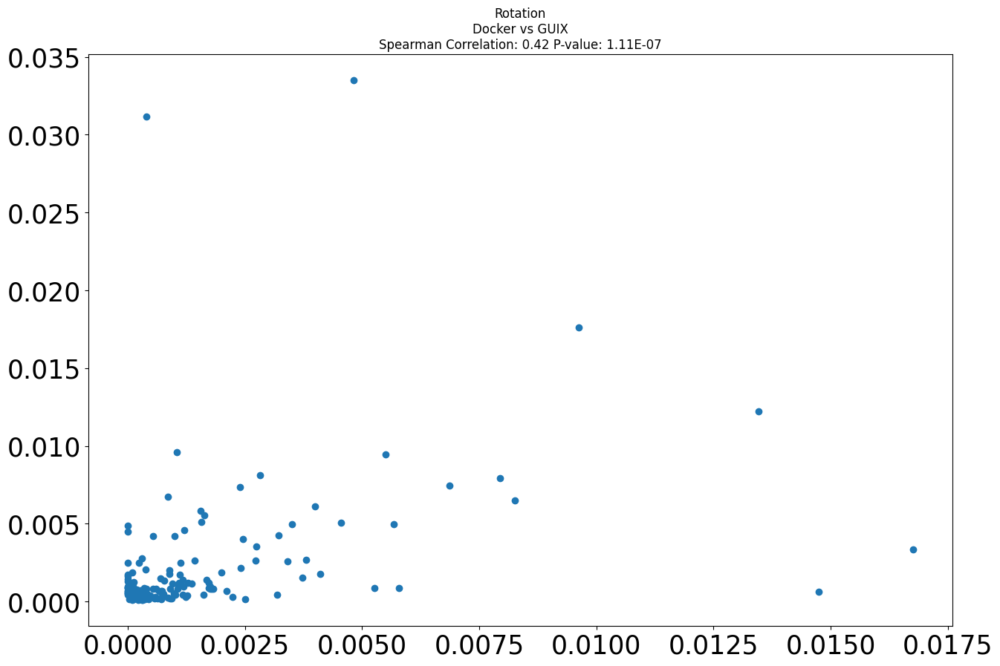

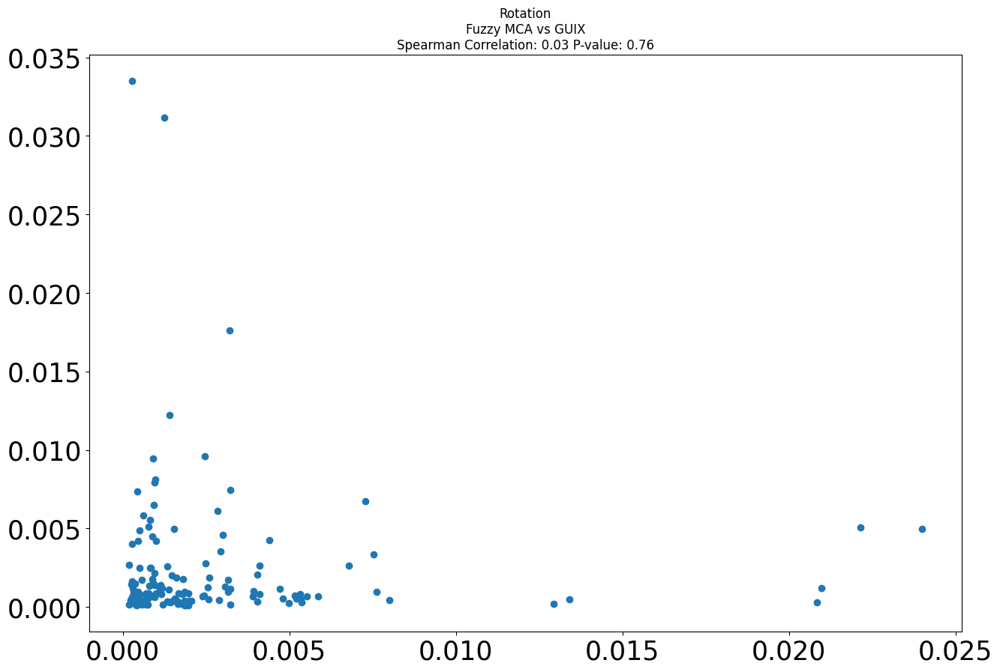

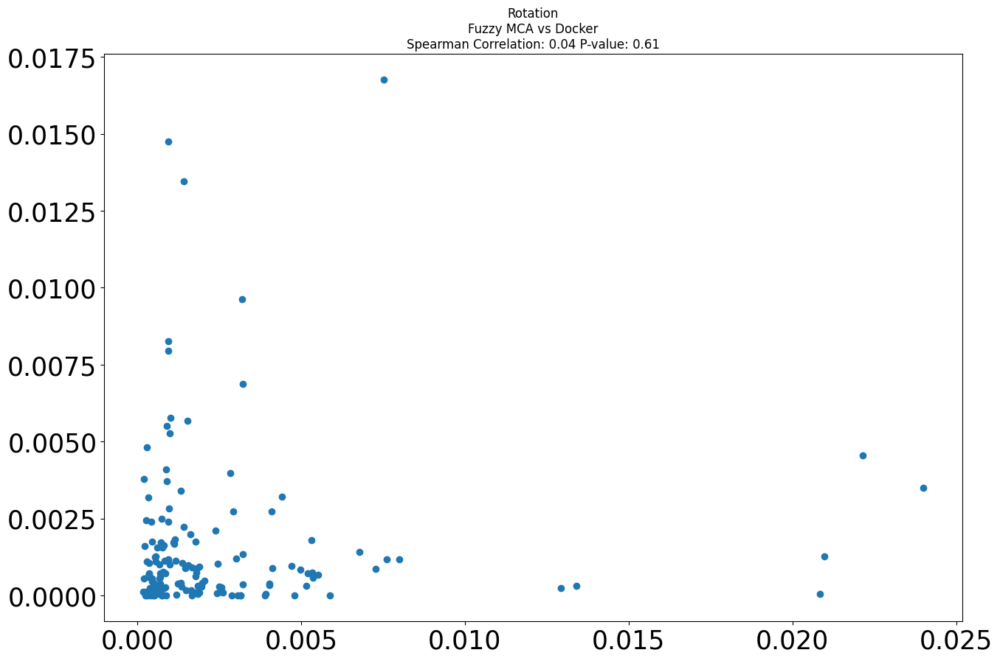

In [179]:
plt.figure(figsize=(15,10))
plt.scatter(list(dist_rot_arch['Docker'].values()), list(dist_rot_arch['GUIX'].values())), #plt.ylabel('Docker Mean Significant Digits', size=28), plt.xlabel('GUIX Mean Significant Digits', size=28)
plt.xticks(size=25), plt.yticks(size=25)
plt.title(f"Rotation\nDocker vs GUIX\nSpearman Correlation: {spearmanr(list(dist_rot_arch['Docker'].values()), list(dist_rot_arch['GUIX'].values()))[0]:.2f} P-value: {spearmanr(list(dist_rot_arch['Docker'].values()), list(dist_rot_arch['GUIX'].values()))[1]:.2E}");
# plt.savefig('imgs/correlation_fuzzy_docker.png');

plt.figure(figsize=(15,10))
plt.scatter(list(dist_rot_fuzzy.values()), list(dist_rot_arch['GUIX'].values())), #plt.ylabel('Docker Mean Significant Digits', size=28), plt.xlabel('GUIX Mean Significant Digits', size=28)
plt.xticks(size=25), plt.yticks(size=25)
plt.title(f"Rotation\nFuzzy MCA vs GUIX\nSpearman Correlation: {spearmanr(list(dist_rot_fuzzy.values()), list(dist_rot_arch['GUIX'].values()))[0]:.2f} P-value: {spearmanr(list(dist_rot_fuzzy.values()), list(dist_rot_arch['GUIX'].values()))[1]:.2f}");
# plt.savefig('imgs/correlation_fuzzy_docker.png');


plt.figure(figsize=(15,10))
plt.scatter(list(dist_rot_fuzzy.values()), list(dist_rot_arch['Docker'].values())), #plt.ylabel('Docker Mean Significant Digits', size=28), plt.xlabel('GUIX Mean Significant Digits', size=28)
plt.xticks(size=25), plt.yticks(size=25)
plt.title(f"Rotation\nFuzzy MCA vs Docker\nSpearman Correlation: {spearmanr(list(dist_rot_fuzzy.values()), list(dist_rot_arch['Docker'].values()))[0]:.2f} P-value: {spearmanr(list(dist_rot_fuzzy.values()), list(dist_rot_arch['Docker'].values()))[1]:.2f}");
# plt.savefig('imgs/correlation_fuzzy_docker.png');